In [1]:
import os
import sys
import inspect

# Insert modules directory, TODO create setup.py file
currentdir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
reports_dir = os.path.dirname(currentdir)
project_home_dir = os.path.dirname(reports_dir)
sys.path.insert(0, f"{project_home_dir}/qcnn") 

In [2]:
import numpy as np
import pandas as pd
from joblib import dump, load
from collections import namedtuple
from IPython.display import display
from pprint import pprint
from circuit_presets import get_wire_combos
from IPython.core.display import display, HTML
from reporting_functions import (
    get_file_content,
    confusion_matrix_stats,
    get_result_table,
    get_result_table_target_pairs,
    gather_results_0_12,
    get_experiment_config,
    get_model_names,
    plot_loss,
    get_line_plot_data,
    plot_119_accuracy_per_structure,
    gather_results_118_135,
    get_model_result_list,
    get_circuit_diagram,
    get_wire_combos_graph
)
path_experiments = f"{project_home_dir}/experiments"

def display_side_by_side(dfs:list, captions:list):
    """Display tables side by side to save vertical space
    Input:
        dfs: list of pandas.DataFrame
        captions: list of table captions
    """
    output = ""
    combined = dict(zip(captions, dfs))
    for caption, df in combined.items():
        output += df.style.set_table_attributes("style='display:inline'").set_caption(caption)._repr_html_()
        output += "\xa0\xa0\xa0"
    display(HTML(output))

<ipython-input-2-2aaa416ab21c>:8: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


### Results overview
___

 - Structure of qcnn is an important hyper parameter and there are multiple ways you can influence the structure
     - Wire combinations / pooling operation
         - In original paper pooling operation was the same each run, we made it a hyper parameter where you generate different pooling strategies
         - Ordering, (Qubit encoding) depending on what pre-processing you're doing it's possible to introduce  a bias towards certain wires which can reduce model performance depending on how you do pooling. For example, PCA is ordered with the first principal component explaining the most variance, if wires 1 - 8 is PCA components 1 - 8 then the first few wires will have the biggest influence on model. This has to be kept in mind when wires are "removed" during pooling
         - Future work: information scrambling
     - Layer Structure
         - Layer structure as in number of convolutions and pooling layers
         - Different circuits in different layers (haven't tried out I think)
         - This is a good way to control the complexity of the model
 - Modelling Framework
     - Dynamic creation of QCNN structure, making it a hyper paramater during training. This includes pooling operation and layer structure.
     - There is also the larger model experiment architecture which enables you to launch multiple experiemnts (classical + quantum models) from a config file. The result being standardized model artifacts that can be loaded again and tools to analyse the experiments.
___
 - Data encoding and pre-processing plays a large role
     - [Maria paper qml as kernel methods](https://arxiv.org/pdf/2101.11020.pdf). We have some results that agrees with the statements from the paper
         - "One can conclude that data encoding fully defines the minimum of a given cost function used to train quantum models".
     - scaling is important and changing the scale can improved performance / generalizability.
         - IQP we found changing from (0, pi) to (0, pi/2) improved performance. (TODO double check)
 - Angle encoding along with circuit U_5 performs the best for this dataset accross the genres
 - Does PCA do most of the modelling?
    - Show those graphs of first few principal component differences
    - No, when relatively good but still random features are selected then we still obtain good performance (similar and sometimes better than pca) across multiple experiments.
 - Multi class classification
     - OVO and OVR not as good as classical one compared to LR and SVM.
___
**Future Experiment work**
 - Test out addition of noise
 - Validate older results with the latest process

### Experiment 0 
___
First experiment, testing out all circuit and encoding combinations for (pop, classical) target pair
 - **Encoding**: *
 - **Circuit**: *
 - **Target Pair**: (Pop, Classical)
 - **Scaling**: minmax(0, 1) / standardised
 - **Feature Selection**: pca
 

embedding_type,Amplitude_Hybrid2_1,Amplitude_Hybrid2_2,Amplitude_Hybrid2_3,Amplitude_Hybrid2_4,Amplitude_Hybrid4_1,Amplitude_Hybrid4_2,Amplitude_Hybrid4_3,Amplitude_Hybrid4_4,Angle,Angular_Hybrid2_1,Angular_Hybrid2_2,Angular_Hybrid2_3,Angular_Hybrid2_4,Angular_Hybrid4_1,Angular_Hybrid4_2,Angular_Hybrid4_3,Angular_Hybrid4_4,circuit Average
circuit,,,,,,,,,,,,,,,,,,
U_13,0.550000,0.566667,0.483333,0.566667,0.583333,0.550000,0.433333,0.483333,1.000000,0.950000,0.983333,0.966667,1.000000,0.983333,1.000000,0.983333,0.966667,0.767647
U_14,0.533333,0.550000,0.616667,0.600000,0.550000,0.533333,0.516667,0.600000,0.983333,0.966667,0.966667,0.983333,0.966667,0.966667,0.950000,0.983333,0.983333,0.779412
U_15,0.583333,0.616667,0.683333,0.600000,0.633333,0.550000,0.500000,0.500000,1.000000,0.983333,0.983333,0.983333,0.966667,0.983333,0.983333,0.983333,1.000000,0.796078
U_5,0.616667,0.650000,0.566667,0.583333,0.450000,0.616667,0.400000,0.516667,1.000000,1.000000,0.966667,0.983333,0.966667,0.950000,0.983333,0.983333,0.983333,0.777451
U_6,0.666667,0.600000,0.550000,0.666667,0.700000,0.716667,0.583333,0.650000,0.983333,1.000000,0.983333,0.983333,1.000000,0.950000,0.983333,1.000000,0.983333,0.823529
U_9,0.666667,0.500000,0.550000,0.516667,0.550000,0.466667,0.600000,0.483333,0.983333,0.966667,0.983333,0.966667,1.000000,1.000000,0.983333,0.983333,0.983333,0.775490
U_SO4,0.683333,0.700000,0.633333,0.733333,0.416667,0.550000,0.550000,0.533333,0.983333,0.966667,0.950000,0.983333,0.983333,0.950000,0.966667,0.983333,0.983333,0.797059
U_SU4,0.550000,0.583333,0.583333,0.566667,0.616667,0.533333,0.533333,0.533333,1.000000,0.983333,0.983333,0.983333,0.983333,0.983333,0.983333,1.000000,1.000000,0.788235
U_TTN,0.583333,0.450000,0.516667,0.616667,0.516667,0.583333,0.433333,0.516667,0.950000,0.983333,0.966667,0.950000,0.983333,0.983333,1.000000,0.983333,0.966667,0.763725


AttributeError: 'AxesSubplot' object has no attribute 'savefig'

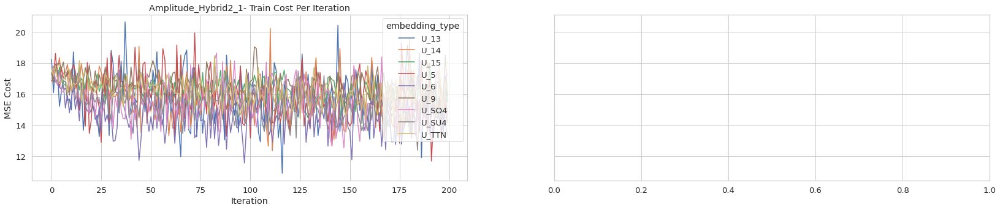

In [5]:
exp_id = 0
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Amplitude_Hybrid* doesn't fit, while all angular methods are able to train
 - Angular_Hybrid2_3, Angular_Hybrid4_1 had consistent test performance on all circuits
 - Angle had good performance except for U_9 and U_TTN
 - Accuracy on pop classical is quite high (easily seperable), to measure encoding methods other target pairs needs to be tested

### Experiment 1
___
Scaling during pre-processing, U_5 circuit with Angle and Amplitude_Hybrid4_4 encoding.
 - **Encoding**: Angle, Amplitude_Hybrid4_4
 - **Circuit**: U_5
 - **Target Pair**: (Pop, Classical)
 - **Scaling**: minmax(-1, 1) / standardised
 - **Feature Selection**: pca
 

embedding_type,Amplitude_Hybrid4_4,Angle,circuit Average
circuit,,,
U_5,0.616667,0.966667,0.791667
embedding_type Average,0.616667,0.966667,0.791667


None

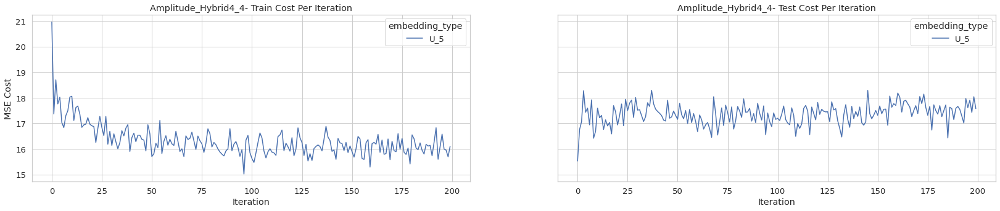

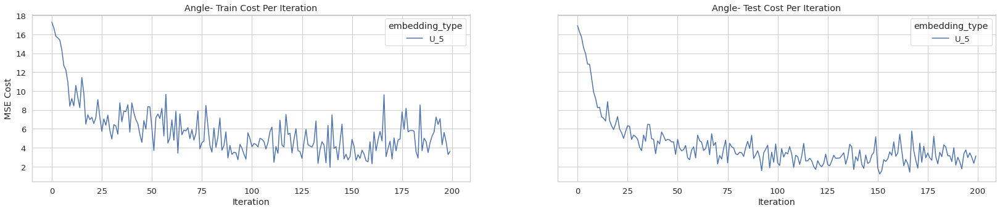

In [9]:
exp_id = 1
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Amplitude_Hybrid4_4 train cost decreases a little but test increases (might be over fitting but the train cost doesn't decrease that much). 

### Experiment 2
___
Standard Scaling (guassian normalization) during pre-processing, U_5 circuit with Angle and Amplitude_Hybrid4_4 encoding.
 - **Encoding**: Angle, Amplitude_Hybrid4_4
 - **Circuit**: U_5
 - **Target Pair**: (Pop, Classical)
 - **Scaling**: standardised
 - **Feature Selection**: pca
 

embedding_type,Amplitude_Hybrid4_4,Angle,circuit Average
circuit,,,
U_5,0.616667,0.8,0.708333
embedding_type Average,0.616667,0.8,0.708333


None

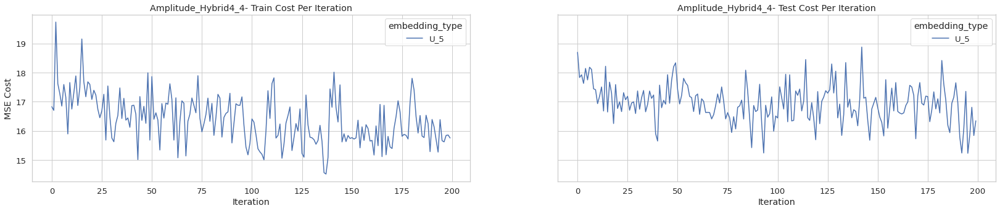

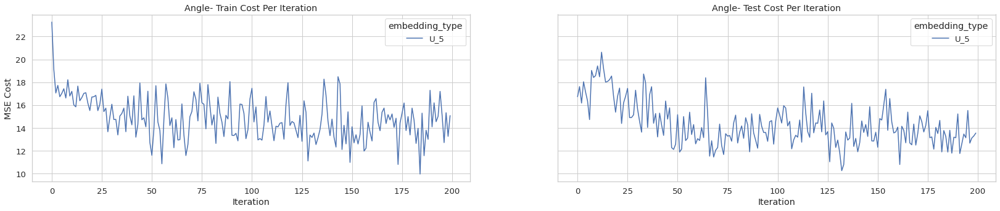

In [15]:
exp_id = 2
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Performance decreased, standardisation does not work well wit Angle+U_5 

### Experiment 3
___
No Scaling except for amplitude, U_5 circuit with Angle and Amplitude_Hybrid4_4 encoding.
 - **Encoding**: Angle, Amplitude_Hybrid4_4
 - **Circuit**: U_5
 - **Target Pair**: (Pop, Classical)
 - **Scaling**: None / standardised
 - **Feature Selection**: pca
 

embedding_type,Amplitude_Hybrid4_4,Angle,circuit Average
circuit,,,
U_5,0.666667,0.4,0.533333
embedding_type Average,0.666667,0.4,0.533333


None

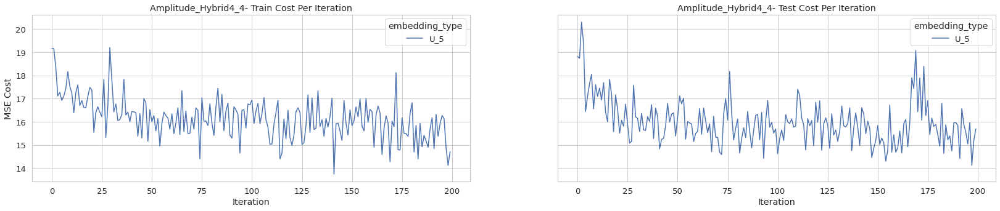

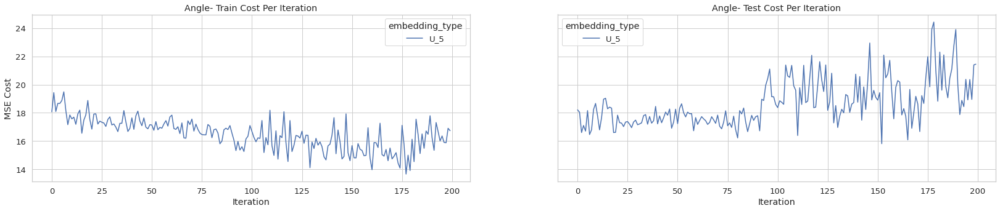

In [14]:
exp_id = 3
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Performance decreased, scaling is rquired for Angle+U_5 

### Experiment 4
___
Default scaling, U_5, U_TTN circuits with mplitude_Hybrid2_1, Amplitude_Hybrid4_4, Angle, Angular_Hybrid2_1 encodings.
 - **Encoding**: Amplitude_Hybrid2_1, Amplitude_Hybrid4_4, Angle, Angular_Hybrid2_1
 - **Circuit**: U_5, U_TTN
 - **Target Pair**: (Pop, Classical)
 - **Scaling**: minmax(0,1) / standardised
 - **Feature Selection**: pca
 

embedding_type,Amplitude_Hybrid2_1,Amplitude_Hybrid4_4,Angle,Angular_Hybrid2_1,circuit Average
circuit,,,,,
U_5,0.650000,0.466667,0.983333,1.000,0.775000
U_TTN,0.666667,0.550000,1.000000,0.950,0.791667
embedding_type Average,0.658333,0.508333,0.991667,0.975,0.783333


None

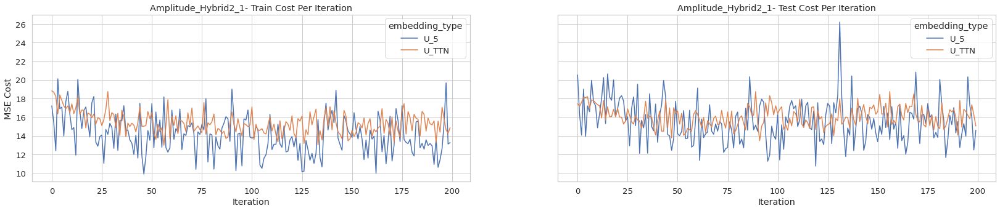

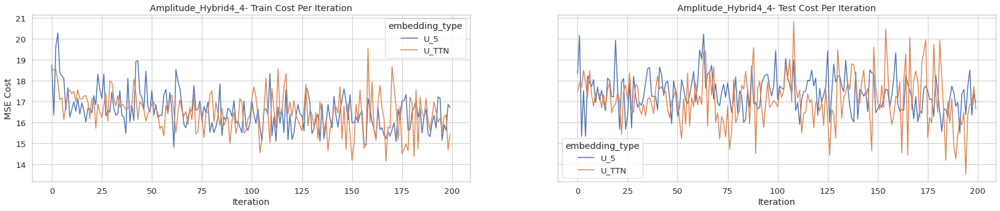

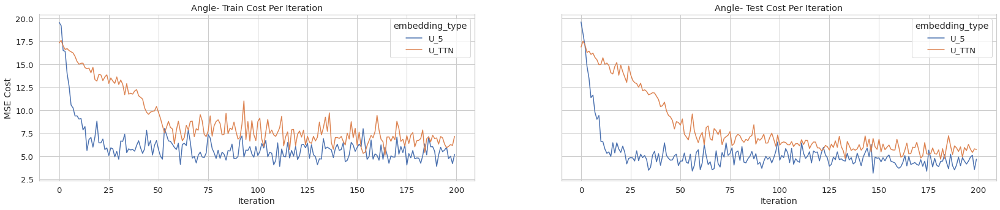

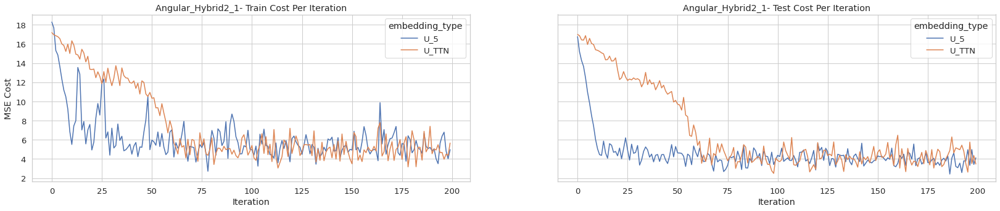

In [18]:
exp_id = 4
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Similar to experiment 1 Angular encoding works well
 - U_5 trains faster than U_TTN

### Experiment 5
___
Trying out a new target pair: Hiphop and Reggae
 - **Encoding**:Amplitude_Hybrid2_1, Amplitude_Hybrid4_4, Angle, Angular_Hybrid2_1
 - **Circuit**: U_5, U_TTN
 - **Target Pair**: (Hihop, Reggae)
 - **Scaling**: minmax(0,1) / standardised
 - **Feature Selection**: pca
 

embedding_type,Amplitude_Hybrid2_1,Amplitude_Hybrid4_4,Angle,Angular_Hybrid2_1,circuit Average
circuit,,,,,
U_5,0.650000,0.366667,0.766667,0.633333,0.604167
U_TTN,0.566667,0.466667,0.583333,0.533333,0.537500
embedding_type Average,0.608333,0.416667,0.675000,0.583333,0.570833


None

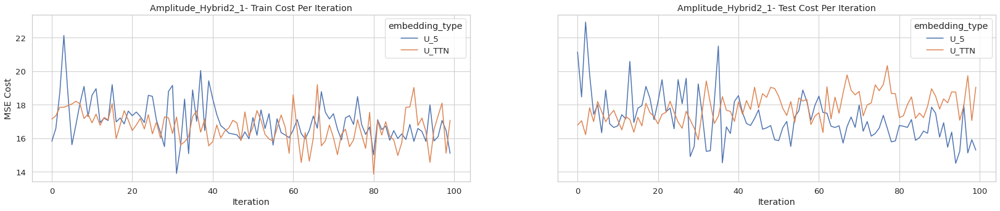

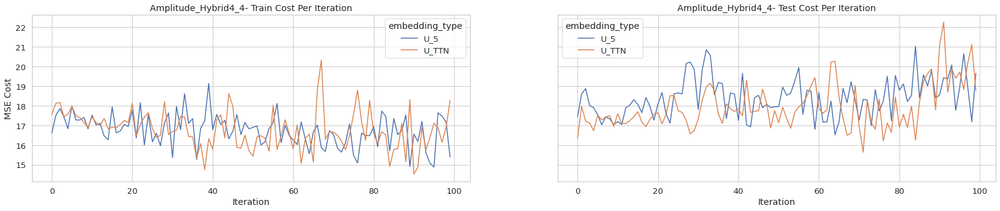

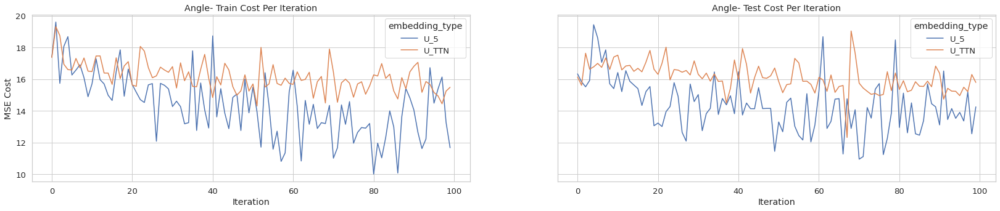

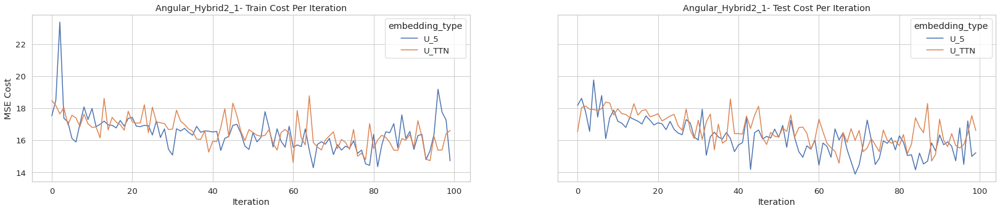

In [21]:
exp_id = 5
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Hiphop vs reggae much harder to model than pop vs classical
 - Angle + U_5 performed the best

### Experiment 6
___
Changed scaling to (0,pi). Using Angle encodings with U_5 and U_TTN.
 - **Encoding**: Angle, Angle_Compact, Angular_Hybrid2_1
 - **Circuit**: U_5, U_TTN
 - **Target Pair**: (hiphop, reggae)
 - **Scaling**: (0,pi)
 - **Feature Selection**: pca
 

/home/matt/dev/projects/quantum-cnn/qcnn/reporting_functions.py:72: RuntimeWarning: invalid value encountered in long_scalars
  precision = cf[1, 1] / sum(cf[:, 1])


embedding_type,Angle,Angle_Compact,Angular_Hybrid2_1,circuit Average
circuit,,,,
U_5,0.750000,0.516667,0.700000,0.655556
U_TTN,0.666667,0.483333,0.666667,0.605556
embedding_type Average,0.708333,0.500000,0.683333,0.630556


None

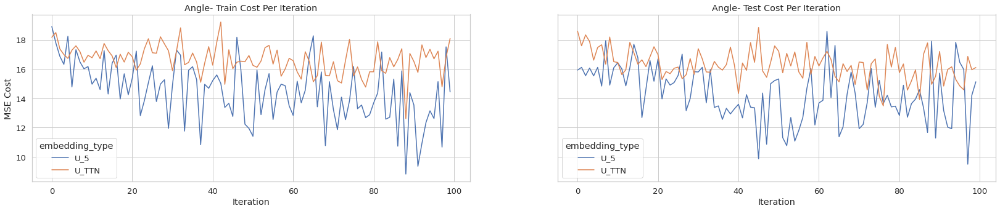

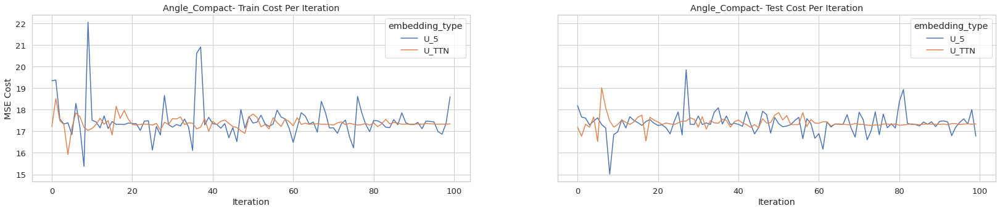

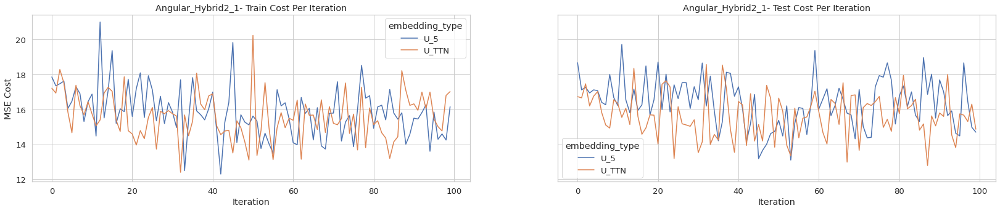

In [24]:
exp_id = 6
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Similar results to experiment 5, Angle performance slightly decreased but at this stage it was just one training run.
 - Encoding average for Angle increased, U_TTN performed better 58%->66% with this scaling. This might sugest the 0,pi range generalizes accros different problem domains better. To validate this variablity needs to be checked. TODO
 - It's interresting how Angle-Compact stabilizes (doesn't train but variability seems to decrease especially for U_5)

### Experiment 7
___
Changed scaling to (-pi,pi). Using Angle encodings with U_5 and U_TTN.
 - **Encoding**: Angle, Angle_Compact, Angular_Hybrid2_1
 - **Circuit**: U_5, U_TTN
 - **Target Pair**: (hiphop, reggae)
 - **Scaling**: minmax(-pi, pi)
 - **Feature Selection**: pca
 

/home/matt/dev/projects/quantum-cnn/qcnn/reporting_functions.py:72: RuntimeWarning: invalid value encountered in long_scalars
  precision = cf[1, 1] / sum(cf[:, 1])


embedding_type,Angle,Angle_Compact,Angular_Hybrid2_1,circuit Average
circuit,,,,
U_5,0.550,0.483333,0.566667,0.533333
U_TTN,0.600,0.516667,0.466667,0.527778
embedding_type Average,0.575,0.500000,0.516667,0.530556


None

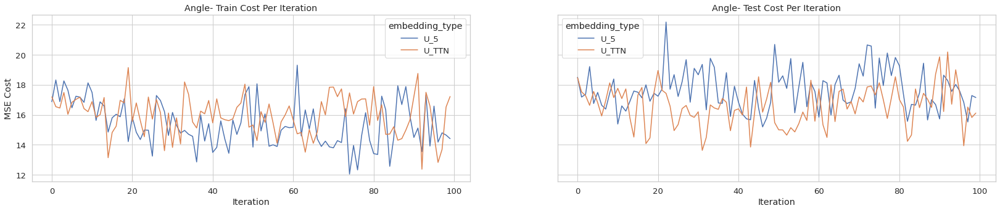

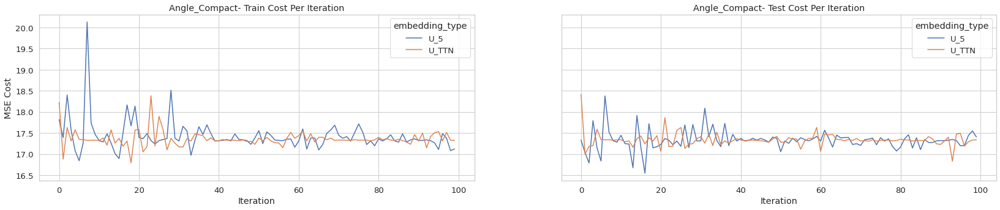

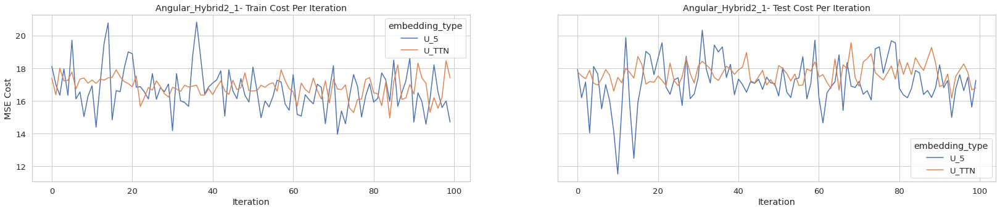

In [27]:
exp_id = 7
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Performance decreased overall, scaling Angle encodings between (-pi,pi) made it more difficult to train 

### Experiment 8
___
Changed scaling to (-2\*pi,2\*pi). Using Angle encodings with U_5 and U_TTN.
 - **Encoding**: Angle, Angle_Compact, Angular_Hybrid2_1
 - **Circuit**: U_5, U_TTN
 - **Target Pair**: (hiphop, reggae)
 - **Scaling**: minmax(-2\*pi, 2\*pi)
 - **Feature Selection**: pca
 

/home/matt/dev/projects/quantum-cnn/qcnn/reporting_functions.py:72: RuntimeWarning: invalid value encountered in long_scalars
  precision = cf[1, 1] / sum(cf[:, 1])


embedding_type,Angle,Angle_Compact,Angular_Hybrid2_1,circuit Average
circuit,,,,
U_5,0.650,0.483333,0.433333,0.522222
U_TTN,0.500,0.516667,0.483333,0.500000
embedding_type Average,0.575,0.500000,0.458333,0.511111


None

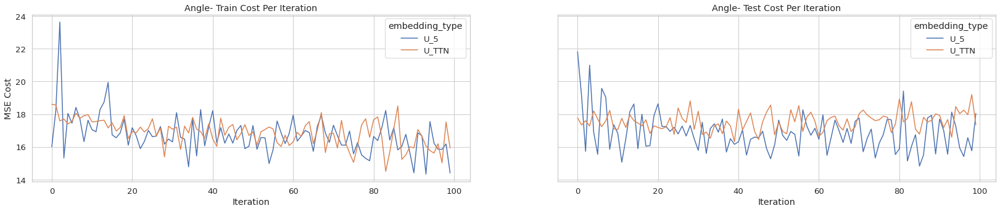

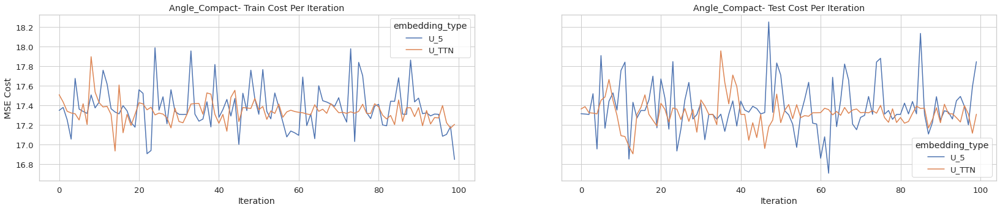

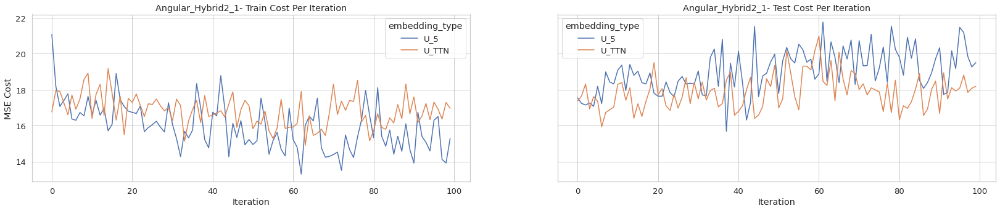

In [31]:
exp_id = 8
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Performance decreased overall, scaling Angle encodings between (-2\*pi,2\*pi) made it more difficult to train 

### Experiment 9
___
Increased iterations (200), all circuits comparing Angle and Angular_Hybrid2_1 encodings (from exp 0 Angular_Hybrid2_1, Angular_Hybrid4_1 it would be good to test them aswell TODO)
 - **Encoding**: Angle, Angulare_Hybrid2_1
 - **Circuit**: *
 - **Target Pair**: (hiphop, reggae)
 - **Scaling**: minmax(0,pi)
 - **Feature Selection**: pca
 - **Iterations**: 200
 

embedding_type,Angle,Angular_Hybrid2_1,circuit Average
circuit,,,
U_13,0.633333,0.716667,0.675000
U_14,0.666667,0.633333,0.650000
U_15,0.633333,0.683333,0.658333
U_5,0.816667,0.700000,0.758333
U_6,0.800000,0.650000,0.725000
U_9,0.666667,0.500000,0.583333
U_SO4,0.766667,0.583333,0.675000
U_SU4,0.766667,0.650000,0.708333
U_TTN,0.616667,0.650000,0.633333


None

None

None

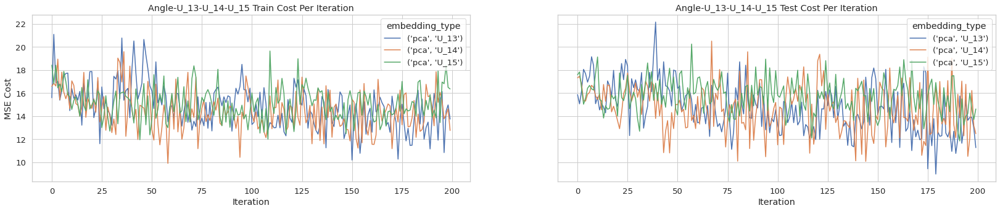

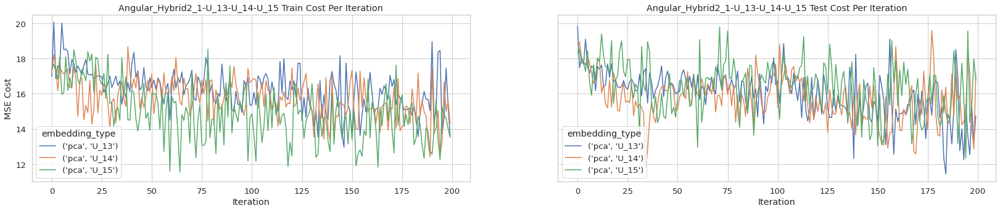

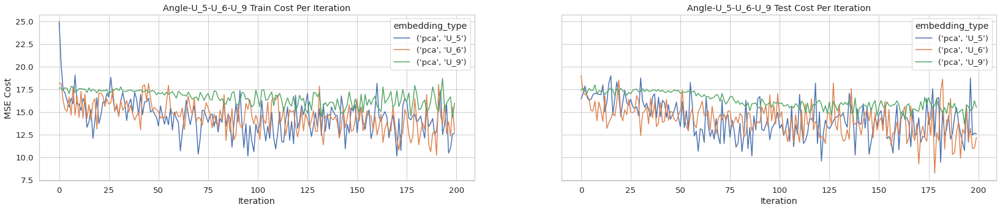

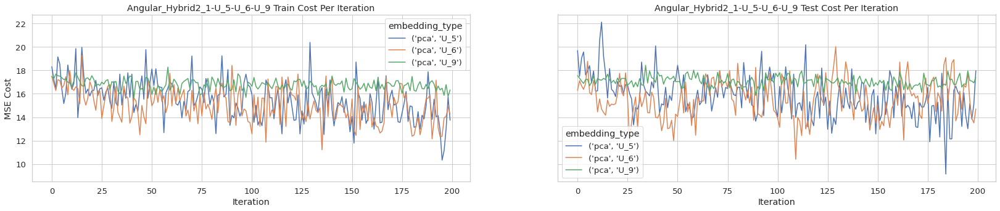

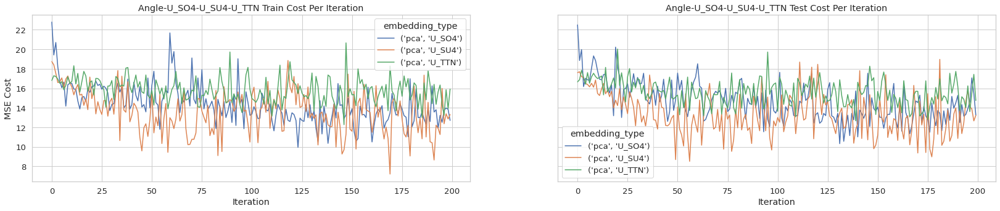

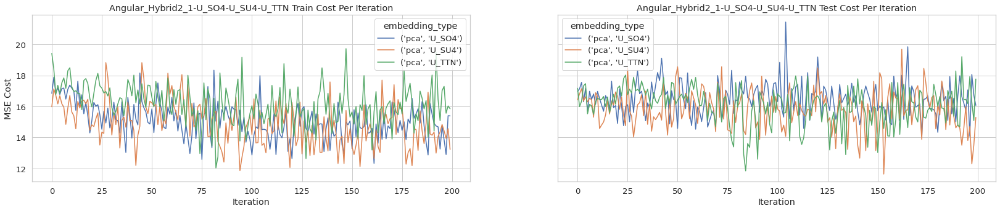

In [55]:
exp_id = 9
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_13","U_14","U_15"], figsize=(28, 5)))
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_5","U_6","U_9"], figsize=(28, 5)))
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_SO4","U_SU4","U_TTN"], figsize=(28, 5)))

#### Remarks

 - U_5, U_6, U_9 had the most stable performance (they are related TODO check how again)
 - Angle+U_5 had the highest accuracy
 - U_9 didn't vary much at all
 - Angle + (U_5 or U6) both achieved accuracies above 80% which is good considering later in experiment 114 all classical models accuracy were smaller than 80%. See below
     - The modelling process at that time had already been refined, 5-fold CV where here it's only one training run. So the variablity of these early models might be high and it'd be worth to check them out again (TODO)
 
 - TODO test same experiment on Angular_Hybrid2_1, Angular_Hybrid4_1

In [ ]:
(logistic_regression, pca, minmax)       0.729560
(logistic_regression, pca, standard)     0.754717
(logistic_regression, tree, minmax)      0.754717
(logistic_regression, tree, standard)    0.754717
(svm, pca, minmax)                       0.716981
(svm, pca, standard)                     0.754717
(svm, tree, minmax)                      0.767296
(svm, tree, standard)                    0.716981
selection_method Average                 0.743711

### Experiment 10
___
All circuits comparing Amplitude_Hybrid2_1, Angle, Angular_Hybrid2_1 encodings
 - **Encoding**: Amplitude_Hybrid2_1, Angle, Angular_Hybrid2_1 
 - **Circuit**: *
 - **Target Pair**: (disco, jazz)
 - **Scaling**: minmax(0,pi)
 - **Feature Selection**: pca
 - **Iterations**: 100
 

embedding_type,Amplitude_Hybrid2_1,Angle,Angular_Hybrid2_1,circuit Average
circuit,,,,
U_13,0.583333,0.683333,0.650000,0.638889
U_14,0.633333,0.683333,0.600000,0.638889
U_15,0.566667,0.716667,0.783333,0.688889
U_5,0.600000,0.766667,0.750000,0.705556
U_6,0.583333,0.733333,0.583333,0.633333
U_9,0.633333,0.616667,0.600000,0.616667
U_SO4,0.450000,0.700000,0.800000,0.650000
U_SU4,0.566667,0.783333,0.750000,0.700000
U_TTN,0.566667,0.733333,0.583333,0.627778


None

None

None

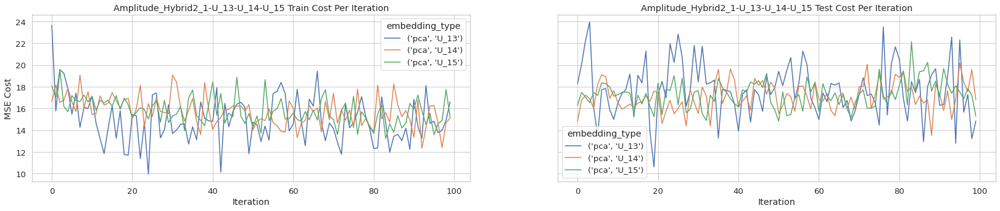

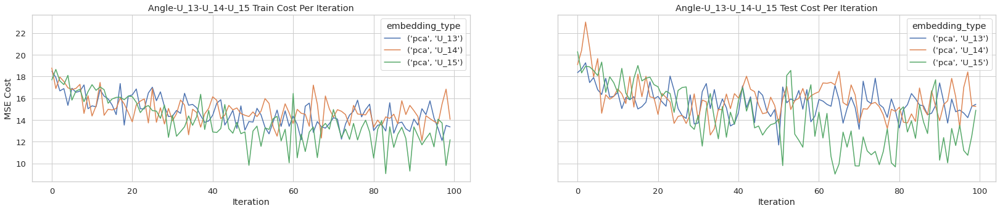

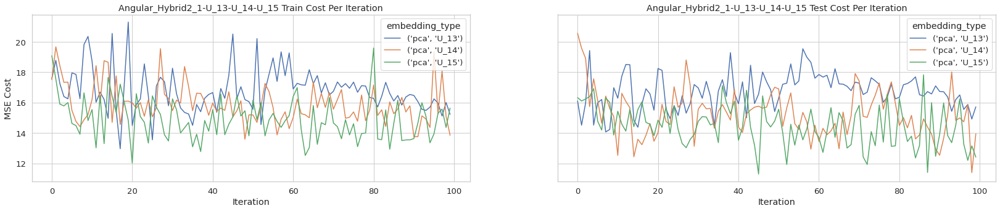

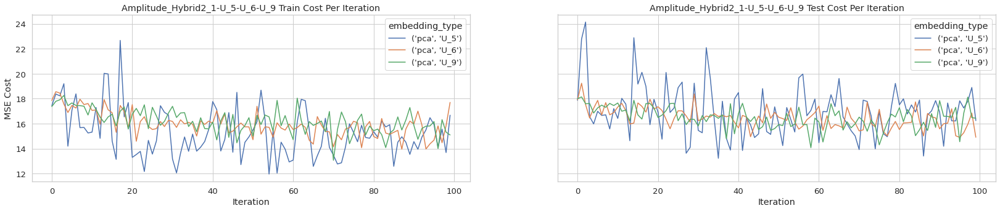

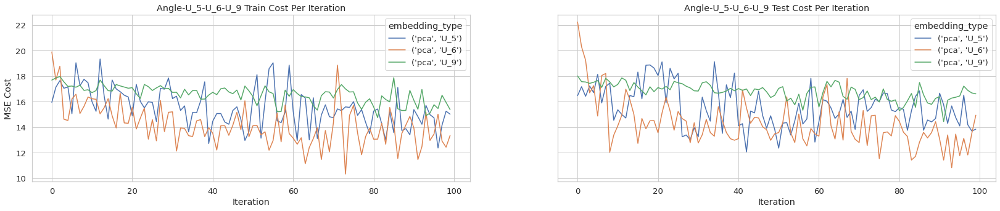

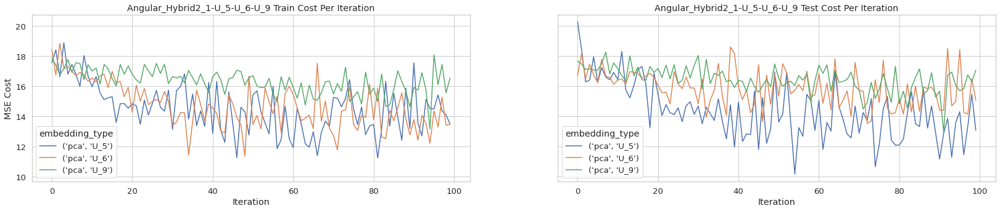

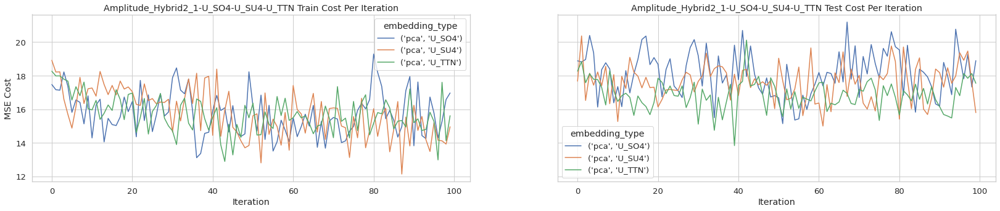

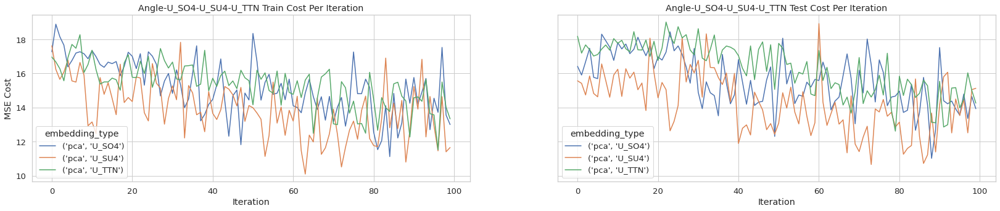

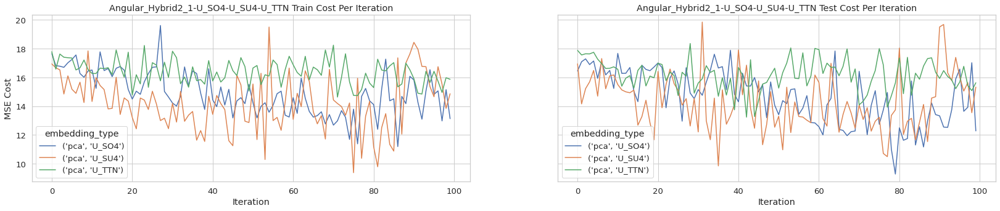

In [59]:
exp_id = 10
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_13","U_14","U_15"], figsize=(28, 5)))
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_5","U_6","U_9"], figsize=(28, 5)))
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_SO4","U_SU4","U_TTN"], figsize=(28, 5)))

#### Remarks

 - U_5, U_6, U_9 had the most stable performance again
 - Angular_Hybrid2_1+U_SO4 had the highest accuracy this time 80%
 - U_9 didn't vary much again
 - U_5 had the highest circuit average 0.705556
 - Angle had the highest encoding average 0.712963
 
 - Classical models had a easier time in training on disc, jazz
 
 - TODO test same experiment on Angular_Hybrid2_1, Angular_Hybrid4_1

In [ ]:
(logistic_regression, pca, minmax)       0.940299
(logistic_regression, pca, standard)     0.940299
(logistic_regression, tree, minmax)      0.950249
(logistic_regression, tree, standard)    0.955224
(svm, pca, minmax)                       0.955224
(svm, pca, standard)                     0.940299
(svm, tree, minmax)                      0.970149
(svm, tree, standard)                    0.970149
selection_method Average                 0.952736

### Experiment 11
___
Metal and Rock.All circuits comparing Amplitude_Hybrid2_1, Angle, Angular_Hybrid2_1 encodings
 - **Encoding**: Amplitude_Hybrid2_1, Angle, Angular_Hybrid2_1 
 - **Circuit**: *
 - **Target Pair**: (metal, rock)
 - **Scaling**: minmax(0,pi)
 - **Feature Selection**: pca
 - **Iterations**: 100
 

embedding_type,Amplitude_Hybrid2_1,Angle,Angular_Hybrid2_1,circuit Average
circuit,,,,
U_13,0.516667,0.666667,0.500000,0.561111
U_14,0.566667,0.666667,0.483333,0.572222
U_15,0.550000,0.733333,0.650000,0.644444
U_5,0.516667,0.700000,0.683333,0.633333
U_6,0.533333,0.666667,0.666667,0.622222
U_9,0.550000,0.583333,0.616667,0.583333
U_SO4,0.533333,0.700000,0.700000,0.644444
U_SU4,0.583333,0.700000,0.616667,0.633333
U_TTN,0.550000,0.616667,0.516667,0.561111


None

None

None

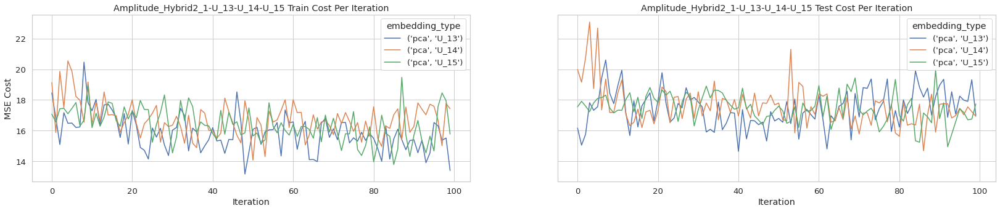

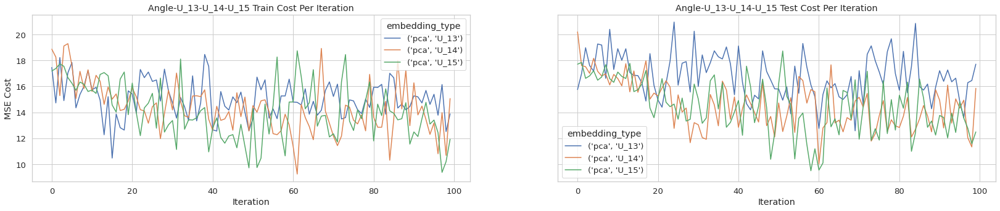

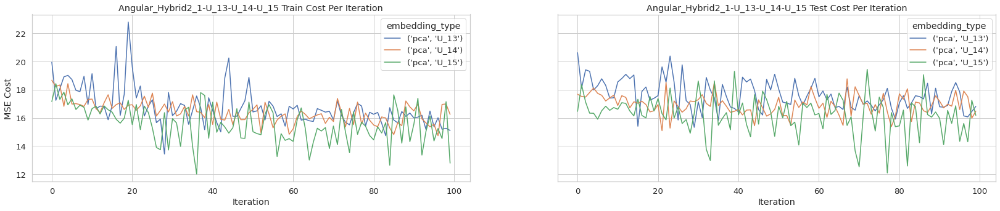

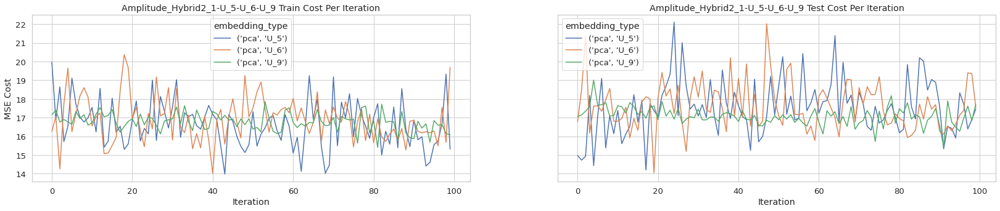

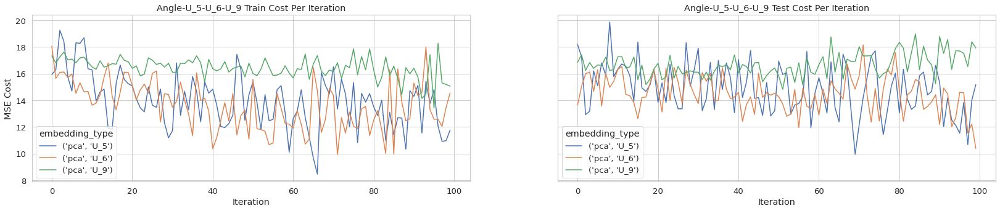

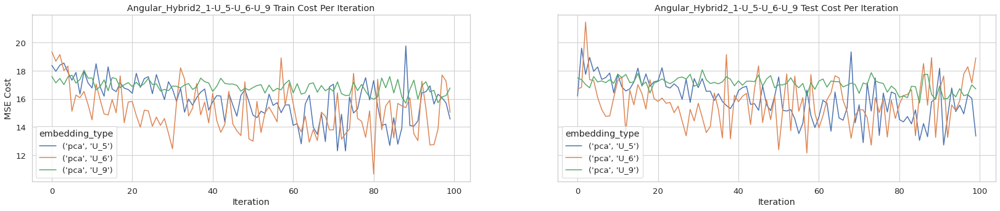

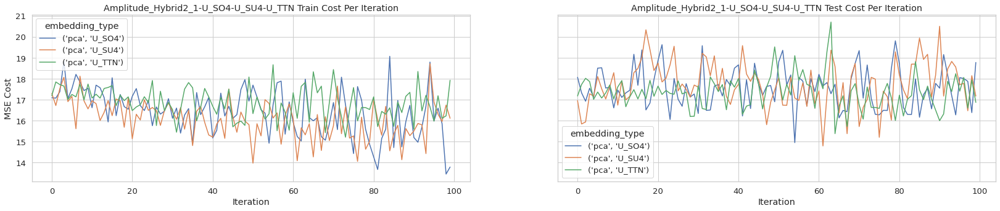

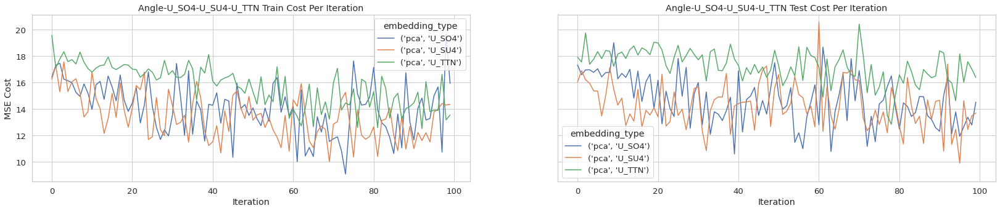

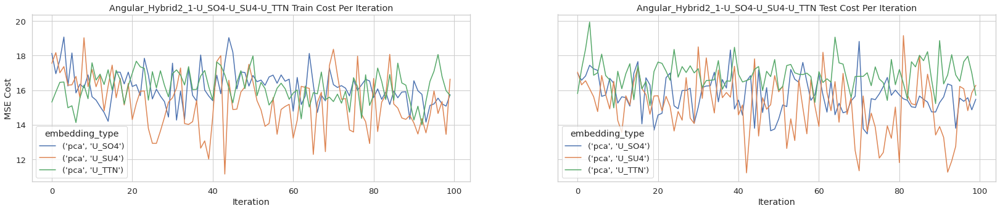

In [62]:
exp_id = 11
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_13","U_14","U_15"], figsize=(28, 5)))
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_5","U_6","U_9"], figsize=(28, 5)))
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_SO4","U_SU4","U_TTN"], figsize=(28, 5)))

#### Remarks

 - Metal + Rock is hard to distinguish
 - Angle+U_15 had the highest accuracy this time 0.733333
 - U_SO4 and U_15  had the highest circuit average 0.644444
 - Angle had the highest encoding average 0.670370
 - U_9 + Angular Hybrid didn't vary much
 - Classical models had a easier time in training on disc, jazz
 
 - TODO test same experiment on Angular_Hybrid2_1, Angular_Hybrid4_1

In [ ]:
(logistic_regression, pca, minmax)       0.815385
(logistic_regression, pca, standard)     0.815385
(logistic_regression, tree, minmax)      0.856410
(logistic_regression, tree, standard)    0.861538
(svm, pca, minmax)                       0.800000
(svm, pca, standard)                     0.830769
(svm, tree, minmax)                      0.861538
(svm, tree, standard)                    0.861538
selection_method Average                 0.837821

### Experiment 119
___
Increasing structure complexity iteratively for (rock, reggae), (classical,pop)
 - **Encoding**: Angle
 - **Circuit**: U_5 / U_TTN
 - **Target Pair**: (classical, pop), (rock,reggae)
 - **Scaling**: minmax(0,pi/2)
 - **Feature Selection**: pca
 - **Iterations**: 50
 - **cv**: 5 folds
 

In [3]:
exp_id = 119
result_data = gather_results_118_135(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))

groupby = ["additional_structure", "selection_method"]
metric = "accuracy"
data_0 = result_data[result_data["target_pair_str"] == "rock_reggae"].copy()
data_1 = result_data[result_data["target_pair_str"] == "classical_pop"].copy()
plot_data_0 = get_line_plot_data(data_0, groupby, metric)
plot_data_1 = get_line_plot_data(data_1, groupby, metric)

display_side_by_side([plot_data_0[{"pca","tree"}], plot_data_1[{"pca","tree"}]], ['Rock vs Reggae', 'Classical vs Pop'])
fig = plot_119_accuracy_per_structure(result_data, figsize=(14,7))


TypeError: <lambda>() missing 1 required positional argument: 'additional_structure'

In [11]:
result_list = get_model_result_list(get_experiment_config(path_experiments, exp_id))
default_wire_combos = get_wire_combos(8,1,"eo_even",p_step=0,wire_to_cut=0)


custom_1


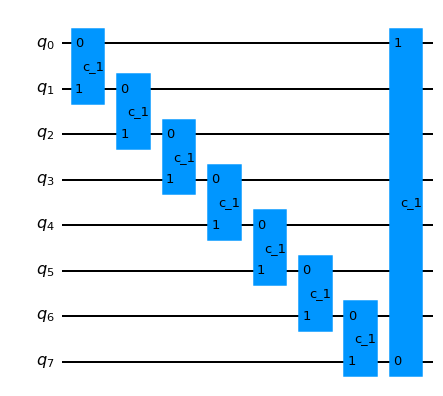

In [20]:
result = result_list[0]
print(result.model_configuration.additional_structure)
layers = result.clf.best_estimator_.layer_dict_.keys()
wire_combos = {layer: wire_pattern for layer, wire_pattern in default_wire_combos.items() if layer in layers}
display(get_circuit_diagram(wire_combos, n_qbits=8))

custom_2


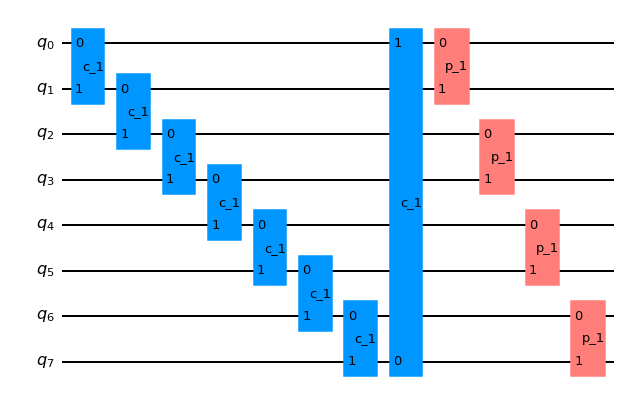

In [22]:
result = result_list[3]
print(result.model_configuration.additional_structure)
layers = result.clf.best_estimator_.layer_dict_.keys()
wire_combos = {layer: wire_pattern for layer, wire_pattern in default_wire_combos.items() if layer in layers}
display(get_circuit_diagram(wire_combos, n_qbits=8))

custom_3


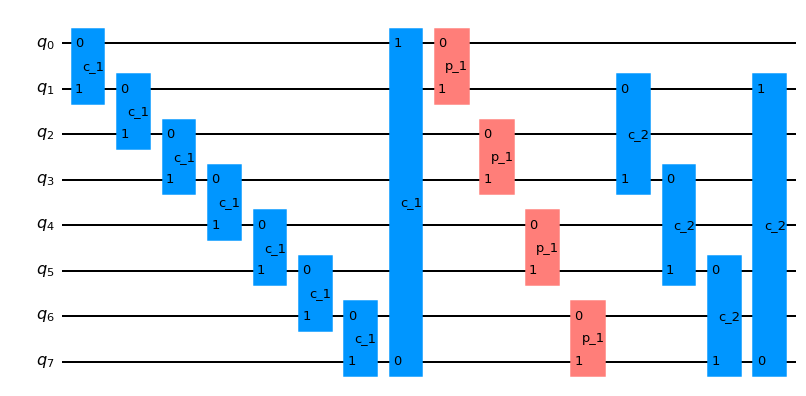

In [31]:
result = result_list[11]
print(result.model_configuration.additional_structure)
layers = result.clf.best_estimator_.layer_dict_.keys()
wire_combos = {layer: wire_pattern for layer, wire_pattern in default_wire_combos.items() if layer in layers}
display(get_circuit_diagram(wire_combos, n_qbits=8))

custom_4


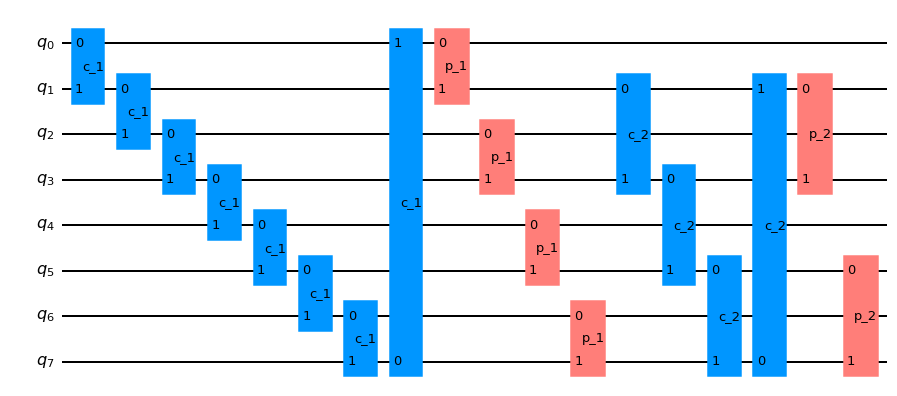

In [35]:
result = result_list[6]
print(result.model_configuration.additional_structure)
layers = result.clf.best_estimator_.layer_dict_.keys()
wire_combos = {layer: wire_pattern for layer, wire_pattern in default_wire_combos.items() if layer in layers}
display(get_circuit_diagram(wire_combos, n_qbits=8))

custom_5


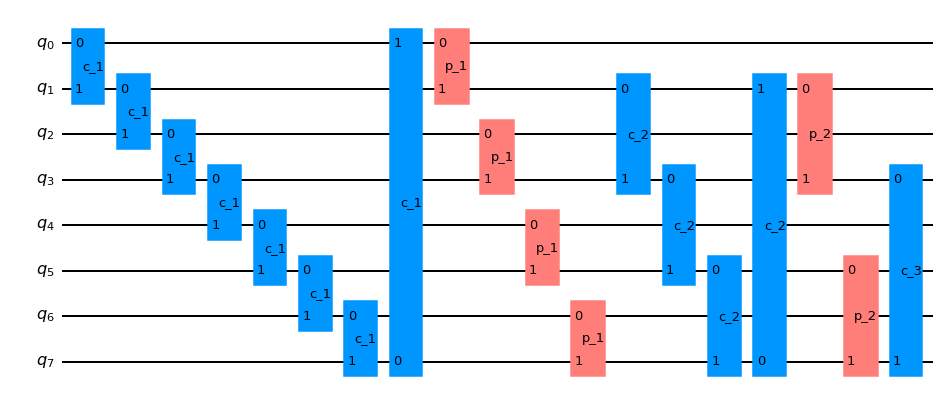

In [39]:
result = result_list[4]
print(result.model_configuration.additional_structure)
layers = result.clf.best_estimator_.layer_dict_.keys()
wire_combos = {layer: wire_pattern for layer, wire_pattern in default_wire_combos.items() if layer in layers}
display(get_circuit_diagram(wire_combos, n_qbits=8))

custom_6


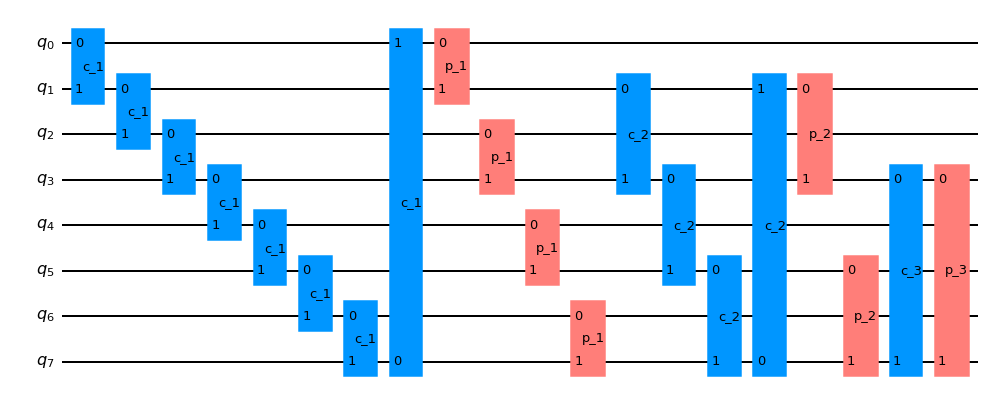

In [41]:
result = result_list[8]
print(result.model_configuration.additional_structure)
layers = result.clf.best_estimator_.layer_dict_.keys()
wire_combos = {layer: wire_pattern for layer, wire_pattern in default_wire_combos.items() if layer in layers}
display(get_circuit_diagram(wire_combos, n_qbits=8))

### Experiment 122
___
Testing out different wire combinations and convolutional structures
 - **Encoding**: Angle
 - **Circuit**: U_5 / U_SU4
 - **Target Pair**: (classical, pop), (rock,reggae)
 - **Scaling**: minmax(0,pi/2)
 - **Feature Selection**: pca, tree
 - **Iterations**: 50
 - **cv**: 5 folds
 

In [12]:
#display(get_experiment_config(path_experiments, exp_id))

In [8]:
exp_id = 122
result_data = gather_results_118_135(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
pd.set_option('display.max_rows', 100)
result_table=get_result_table(
    result_data,
    ["algorithm",  "additional_structure_str",  "selection_method", "target_pair_str"  ],
    "accuracy",
)


In [9]:
result_list = get_model_result_list(get_experiment_config(path_experiments, exp_id))

result = result_list[8]

n_qbits, step, pool_pattern = result.model_configuration.additional_structure[2]
print(result.model_configuration.additional_structure)
wire_combos = get_wire_combos(n_qbits,step, pool_pattern,p_step=0,wire_to_cut=0)

('U_SU4', 'psatz1', [8, 3, 'inside'])


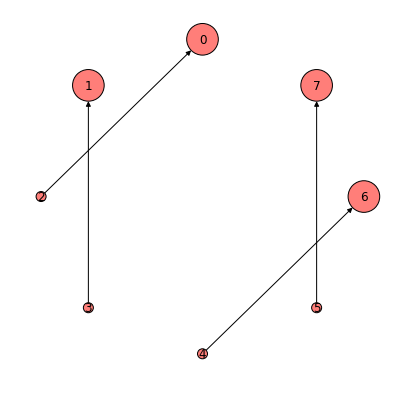

In [10]:
import networkx as nx
import matplotlib.pyplot as plt


fig, ax = plt.subplots(figsize=(7,7))
n_graphs = get_wire_combos_graph(wire_combos, n_qbits=n_qbits)

tmp_g = n_graphs["p_1"]
nx.draw(
            tmp_g[0],
            tmp_g[1],
            with_labels=True,
            node_size=tmp_g[2],
            edge_color="#000000",
            edgecolors="#000000",
            node_color=tmp_g[3],
        )

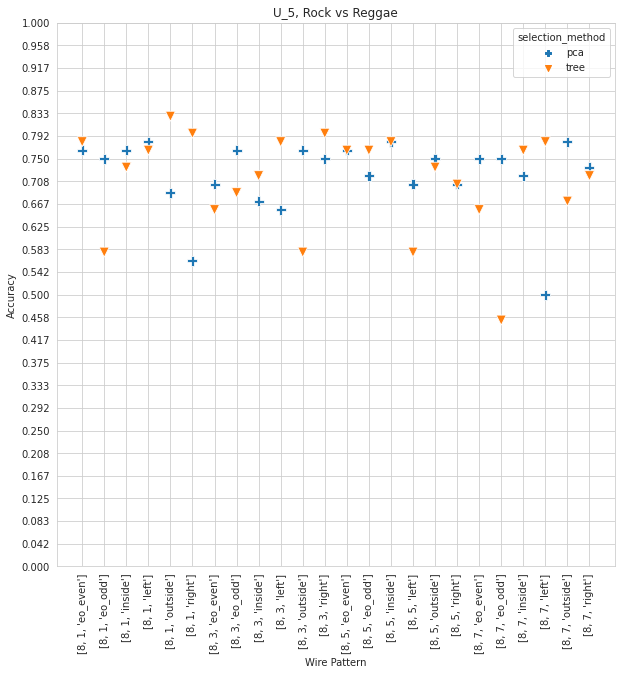

In [11]:
from reporting_functions import plot_122_scatter
fig = plot_122_scatter(result_data)
fig.savefig("plot_pca_in=3RnR_ind=0.svg")

In [3]:
# 201 qcnn hep env required!
from reporting_functions import (generic_plot_201)
exp_id = 201
result_data = gather_results_118_135(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
pd.set_option("display.max_rows", 100)
result_table = get_result_table(
    result_data,
    ["algorithm", "additional_structure_str", "selection_method", "target_pair_str"],
    "accuracy",
)


FileNotFoundError: [Errno 2] No such file or directory: '/home/matt/dev/projects/quantum-cnn/experiments/201'

In [5]:
# Prepare Data
figsize = (10, 10)
groupby = ["wire_config_str", "selection_method"]
metric = "accuracy"
filter_wire = lambda data, key, val: data.apply(
    lambda row: row["wire_config"][key] == val, axis=1
)
filter_col_val = lambda data, col, val: data.apply(lambda row: row[col] == val, axis=1)
U_5_rockreg = result_data[
    filter_col_val(result_data, "target_pair_str", "rock_reggae")
].copy()
U_5_classpop = result_data[
    filter_col_val(result_data, "target_pair_str", "classical_pop")
].copy()
plot_U_5_rockreg = get_line_plot_data(U_5_rockreg, groupby, metric)
plot_U_5_rockreg.index = plot_U_5_rockreg["wire_config_str"]
plot_U_5_classpop = get_line_plot_data(U_5_classpop, groupby, metric)
plot_U_5_classpop.index = plot_U_5_classpop["wire_config_str"]

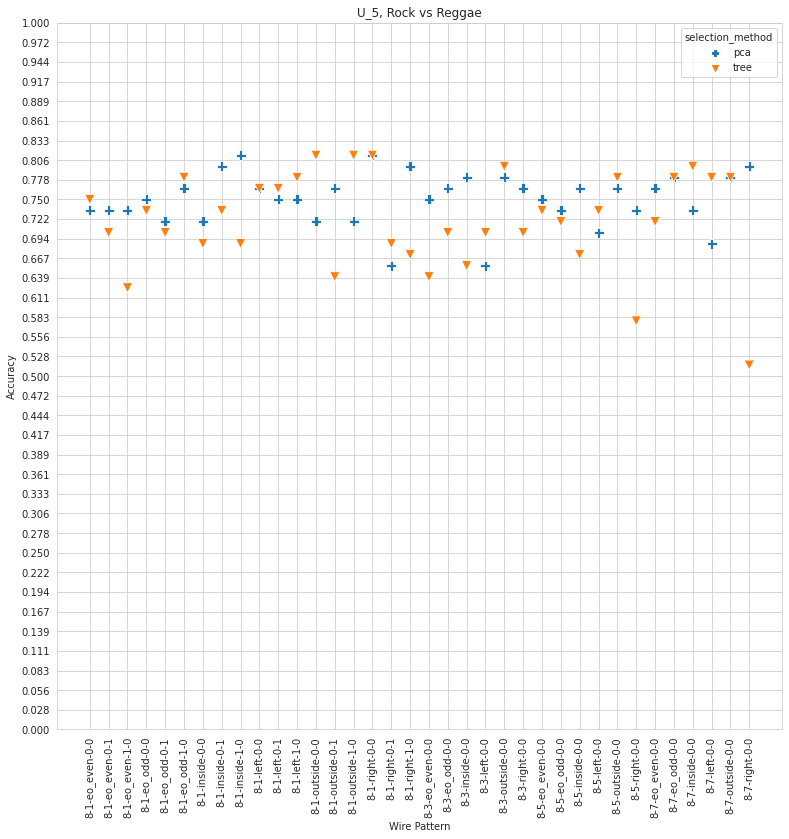

In [6]:
fig = generic_plot_201(
    plot_U_5_rockreg,
    "wire_config_str",
    "Accuracy",
    "selection_method",
    title="U_5, Rock vs Reggae",
    x_label="Wire Pattern",
    figsize=(13,13)
)
fig.savefig("U_5,RnR_vary_struc.svg")

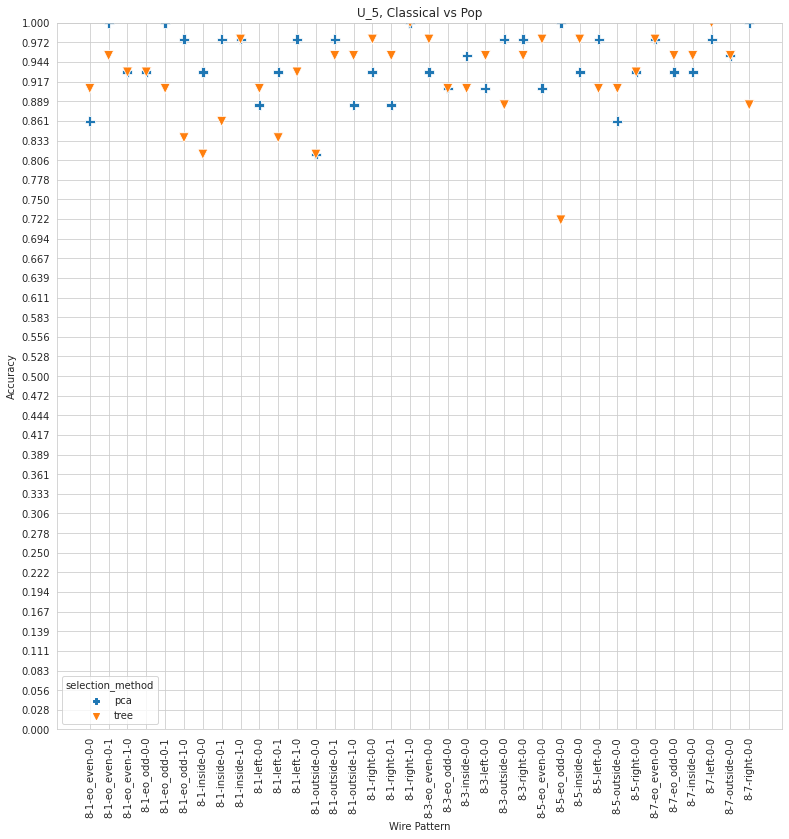

In [7]:
fig = generic_plot_201(
    plot_U_5_classpop,
    "wire_config_str",
    "Accuracy",
    "selection_method",
    title="U_5, Classical vs Pop",
    x_label="Wire Pattern",    
    figsize=(13,13),
    
)
fig.savefig("U_5,CnP_vary_struc.svg")

In [12]:
from reporting_functions import get_model_result_list
# top models
top_5_models = (
    result_table["algorithm Average"].sort_values(ascending=False).head().index
)
filter_col_val = lambda data, col, val: data.apply(lambda row: row[col] == val, axis=1)

top_5_ids = [
    tuple(
        result_data[
            filter_col_val(result_data, "algorithm", model_config[0])
            & filter_col_val(result_data, "additional_structure_str", model_config[1])
            & filter_col_val(result_data, "selection_method", model_config[2])
        ]["model_name"]
    )
    for model_config in top_5_models
]
result_list = get_model_result_list(get_experiment_config(path_experiments, exp_id))
X_test = pd.read_csv(f"{path_experiments}/{exp_id}/X_test.csv", index_col=0)
columns = X_test.columns

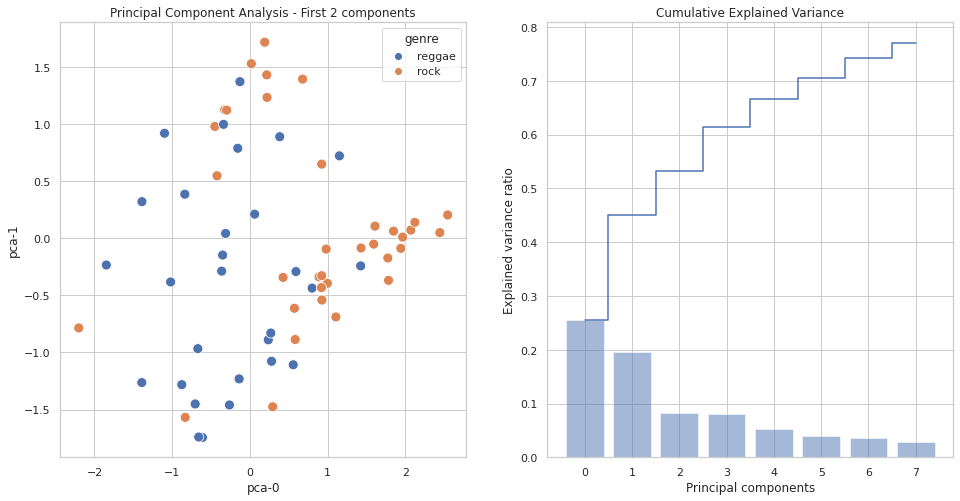

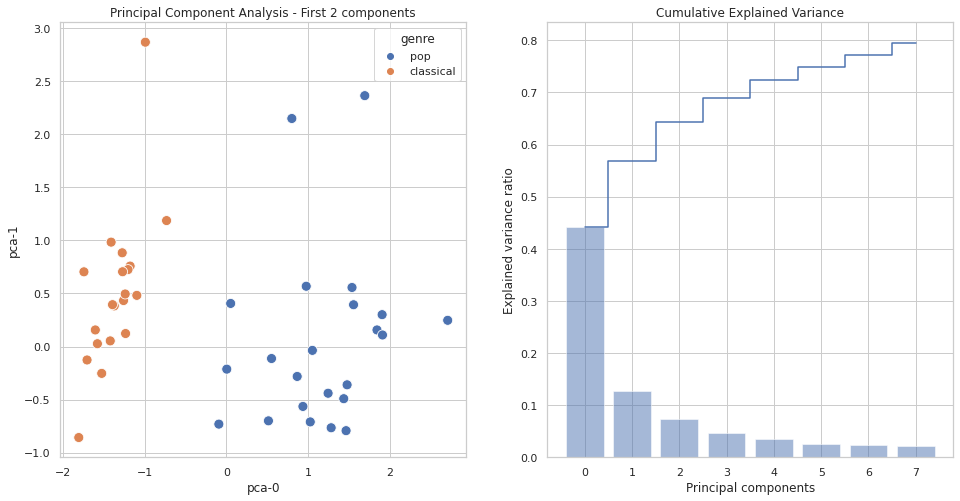

In [18]:
from reporting_functions import plot_binary_pca_model, plot_binary_pair
tmp_model_ids = top_5_ids[0]
tmp_results = [result for result in result_list if result.model_name in tmp_model_ids]
if tmp_results[0].model_configuration.selection_method=="pca":
    plt = plot_binary_pca_model(tmp_results[0])
    plt.savefig("plot_pca_in=3RnR_ind=0.svg")
    plt = plot_binary_pca_model(tmp_results[1])
    plt.savefig("plot_pca_in=3CnP_ind=0.svg")
else:
    plot_binary_pair(tmp_results[0], columns)
    plot_binary_pair(tmp_results[1], columns)

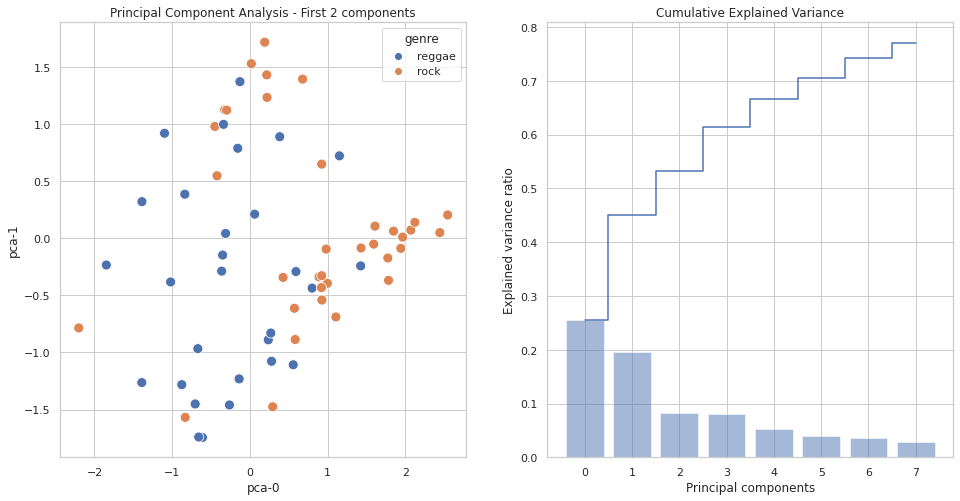

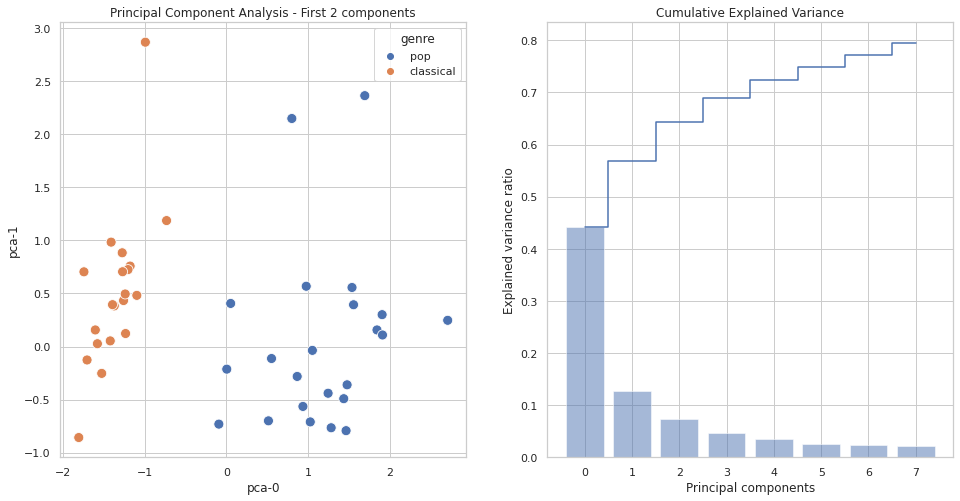

In [19]:
tmp_model_ids = top_5_ids[1]
tmp_results = [result for result in result_list if result.model_name in tmp_model_ids]
if tmp_results[0].model_configuration.selection_method=="pca":
    plt = plot_binary_pca_model(tmp_results[0])
    plt.savefig("plot_pca_in=3RnR_ind=1.svg")
    plt = plot_binary_pca_model(tmp_results[1])
    plt.savefig("plot_pca_in=3CnP_ind=1.svg")
else:
    plot_binary_pair(tmp_results[0], columns)
    plot_binary_pair(tmp_results[1], columns)

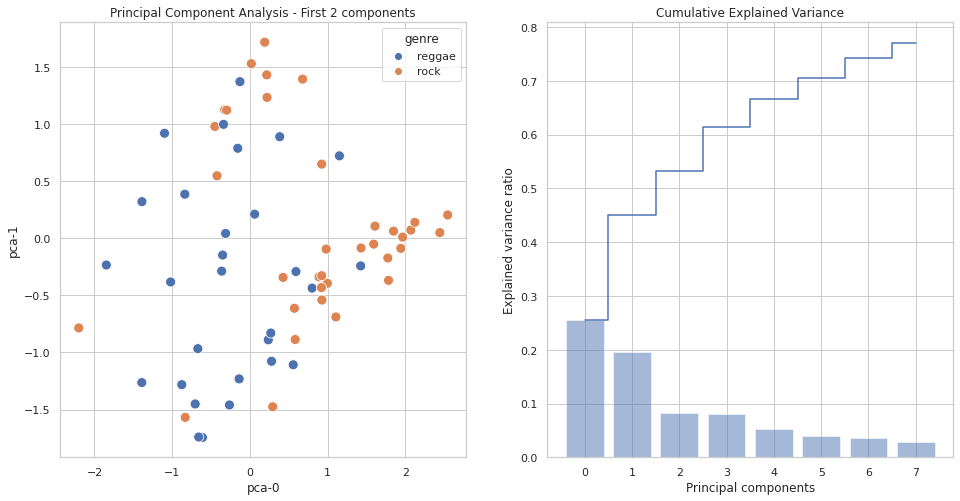

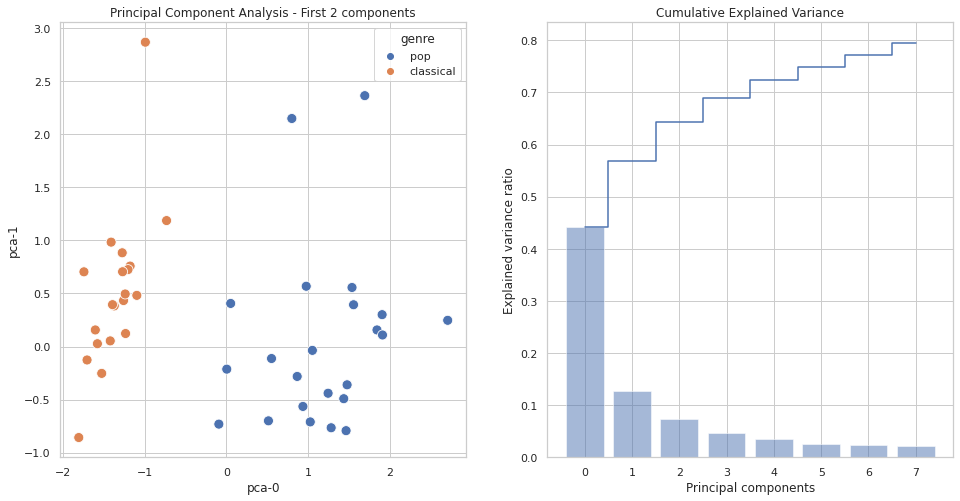

In [20]:
tmp_model_ids = top_5_ids[2]
tmp_results = [result for result in result_list if result.model_name in tmp_model_ids]
if tmp_results[0].model_configuration.selection_method=="pca":
    plt = plot_binary_pca_model(tmp_results[0])
    plt.savefig("plot_pca_in=3RnR_ind=2.svg")
    plt = plot_binary_pca_model(tmp_results[1])
    plt.savefig("plot_pca_in=3CnP_ind=2.svg")
else:
    plot_binary_pair(tmp_results[0], columns)
    plot_binary_pair(tmp_results[1], columns)

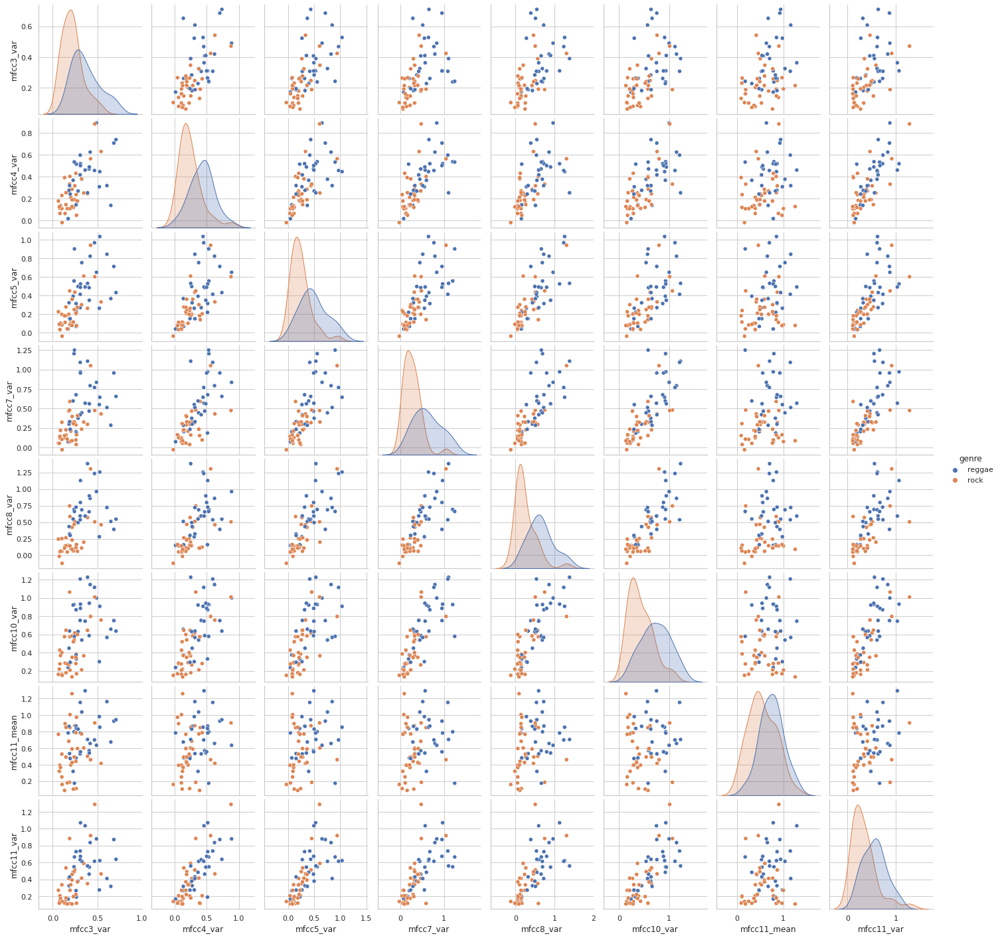

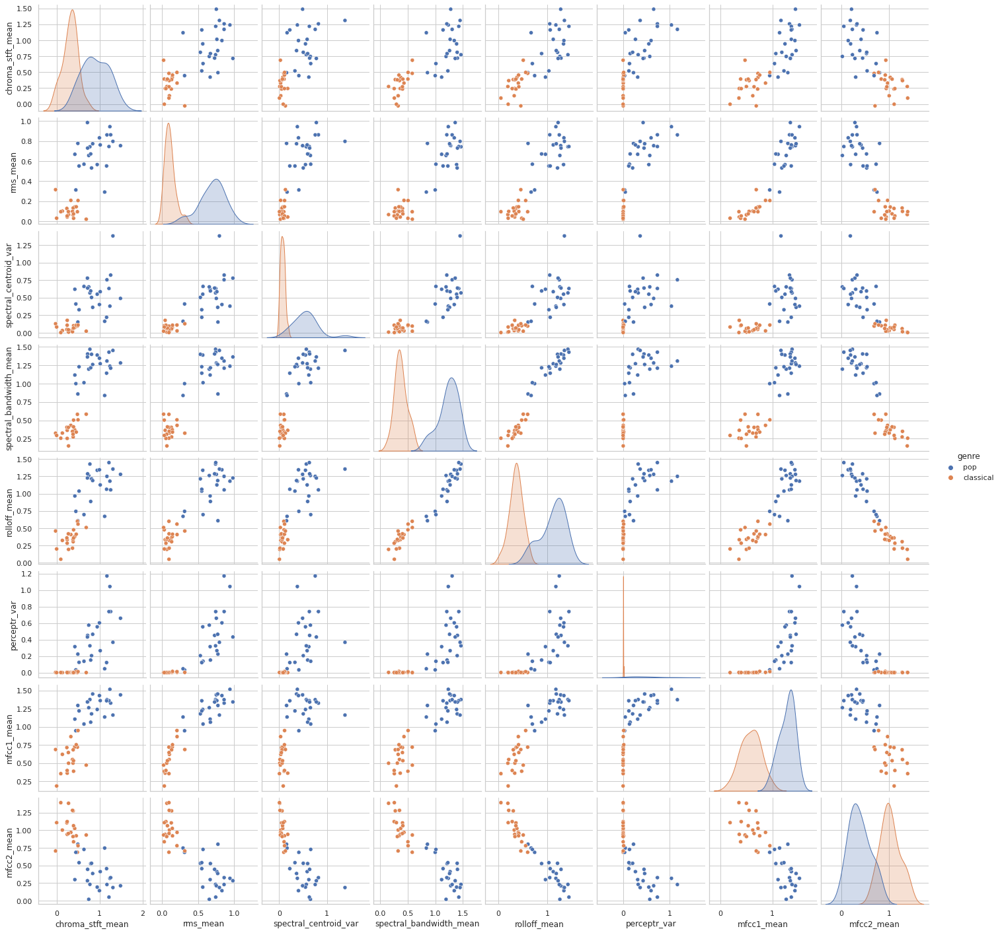

In [16]:
tmp_model_ids = top_5_ids[3]
tmp_results = [result for result in result_list if result.model_name in tmp_model_ids]
if tmp_results[0].model_configuration.selection_method=="pca":
    plot_binary_pca_model(tmp_results[0])
    plot_binary_pca_model(tmp_results[1])
else:
    plt = plot_binary_pair(tmp_results[0], columns)
    plt.savefig("plot_binary_pair_in=3RnR.svg")
    plt = plot_binary_pair(tmp_results[1], columns)
    plt.savefig("plot_binary_pair_in=3CnP.svg")

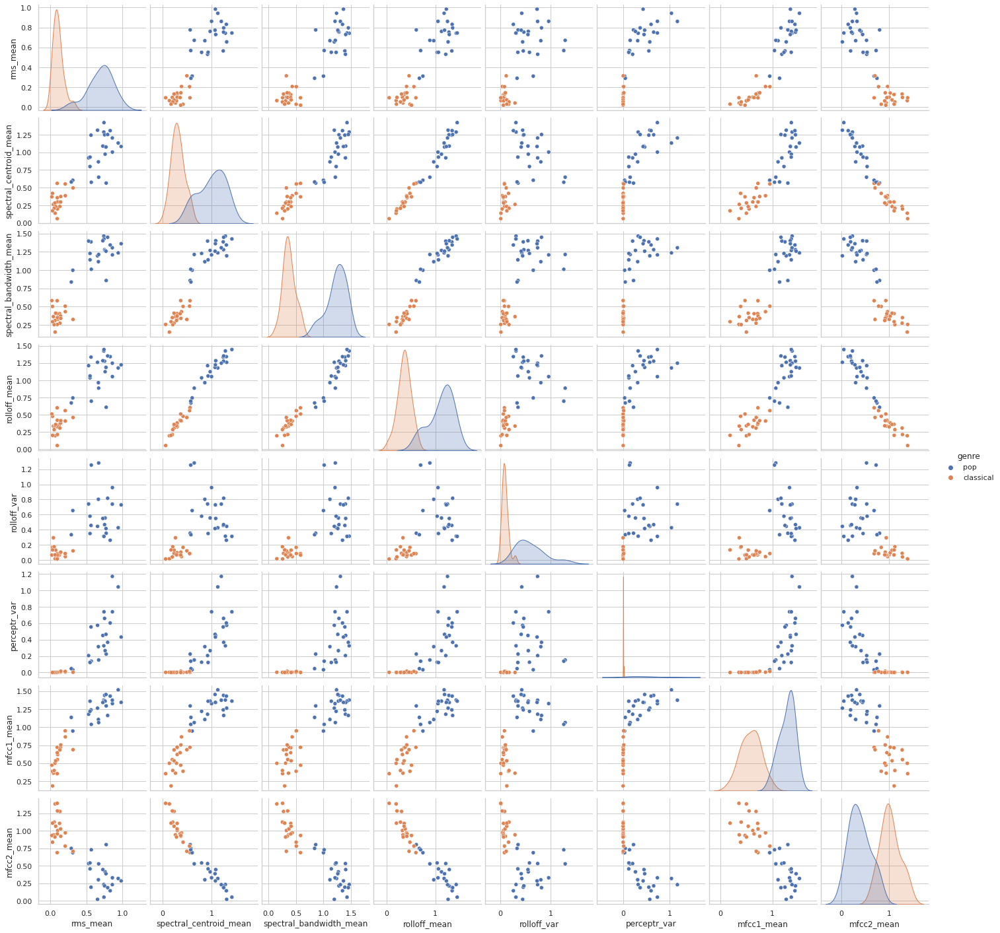

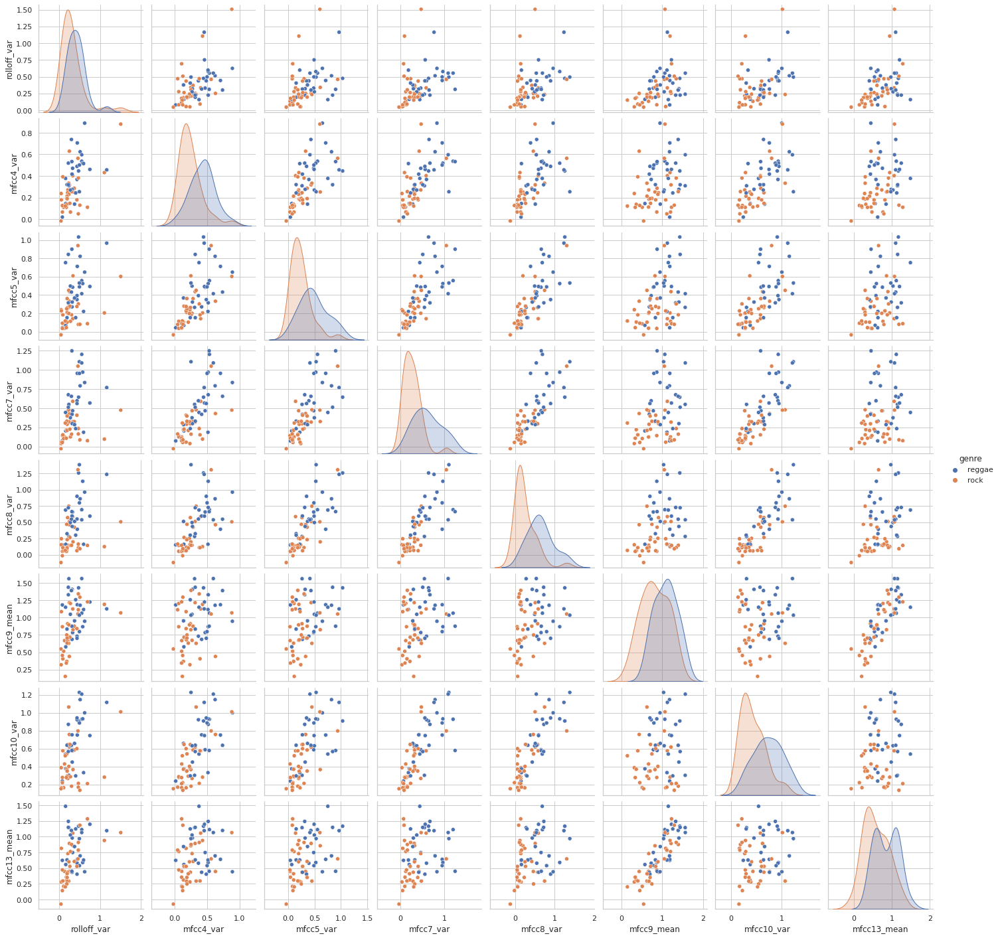

In [17]:
tmp_model_ids = top_5_ids[4]
tmp_results = [result for result in result_list if result.model_name in tmp_model_ids]
if tmp_results[0].model_configuration.selection_method=="pca":
    plot_binary_pca_model(tmp_results[0])
    plot_binary_pca_model(tmp_results[1])
else:
    plt = plot_binary_pair(tmp_results[0], columns)
    plt.savefig("plot_binary_pair_in=4RnR.svg")
    plt = plot_binary_pair(tmp_results[1], columns)
    plt.savefig("plot_binary_pair_in=4CnP.svg")

In [ ]:
# 202

In [4]:
from reporting_functions import plot_triangle_accuracies, get_result_table_target_pairs, gather_results_118_135 
exp_id = 202
result_data = gather_results_118_135(exp_id, path_experiments=path_experiments)
pair_data = get_result_table_target_pairs(
    result_data, "algorithm", "target_pair_str", "accuracy"
)
figsize = (12, 12)
plot_data = pair_data.fillna(1)
plt = plot_triangle_accuracies(plot_data, figsize, title="Accuracy for genre pairs, Quantum 10 paramaters")
# plt.savefig('quantum_best_10_pair.svg')

FileNotFoundError: [Errno 2] No such file or directory: '/home/matt/dev/projects/quantum-cnn/experiments/202'

In [4]:
# 203

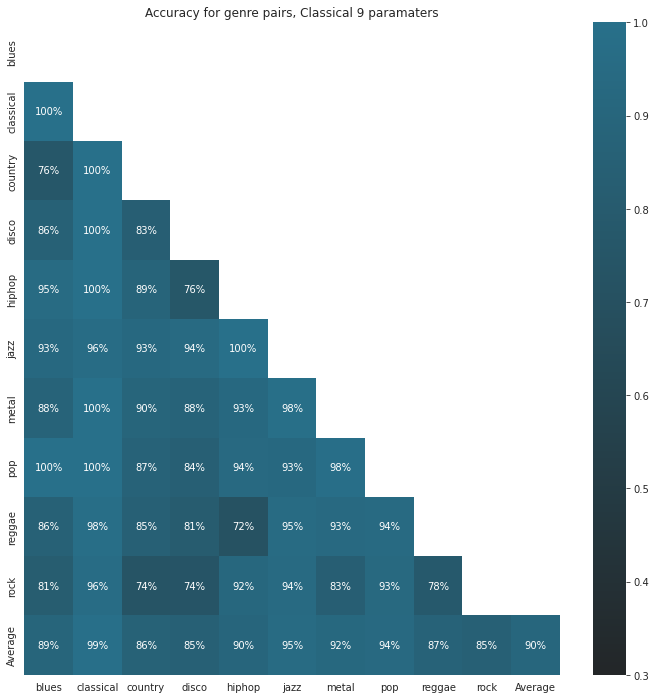

In [4]:
from reporting_functions import (
    plot_triangle_accuracies,
    get_result_table_target_pairs,
    gather_results_118_135,
)

exp_id = 203
result_data = gather_results_118_135(exp_id, path_experiments=path_experiments)
pair_data = get_result_table_target_pairs(
    result_data, "algorithm", "target_pair_str", "accuracy"
)
figsize = (12, 12)
plot_data = pair_data.fillna(1)
plt = plot_triangle_accuracies(
    plot_data, figsize, title="Accuracy for genre pairs, Classical 9 paramaters"
)
plt.savefig("classical_best_10_pair.svg")